# Imports

In [1]:
!pip install ultralytics -q

In [2]:
%env WANDB_DISABLED=True

env: WANDB_DISABLED=True


In [1]:
from ultralytics import YOLO
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import shutil
from PIL import Image
import os

# Preparing Dataset

In [2]:
base_dir = Path('./DataBase/')
img_path = base_dir / 'data_object_image_2' / 'training' / 'image_2'
label_path = base_dir /'data_object_label_2' / 'labels_with_dont_care'
test_path=base_dir / 'data_object_image_2' /'testing' /'image_2'
with open('./DataBase/classes_with_dont_care.json','r') as f:
    classes = json.load(f)

classes

{'Car': 0,
 'Pedestrian': 1,
 'Van': 2,
 'Cyclist': 3,
 'Truck': 4,
 'Misc': 5,
 'Tram': 6,
 'Person_sitting': 7,
 'DontCare': 8}

In [3]:
ims = sorted(list(img_path.glob('*')))
labels = sorted(list(label_path.glob('*')))
pairs = list(zip(ims,labels))
pairs[:2]

[(WindowsPath('DataBase/data_object_image_2/training/image_2/000000.png'),
  WindowsPath('DataBase/data_object_label_2/labels_with_dont_care/000000.txt')),
 (WindowsPath('DataBase/data_object_image_2/training/image_2/000001.png'),
  WindowsPath('DataBase/data_object_label_2/labels_with_dont_care/000001.txt'))]

# Preparing File Structure

In [7]:
train, test = train_test_split(pairs,test_size=0.1,shuffle=True)
len(train), len(test)

(6732, 749)

In [8]:
train_path = Path('train').resolve()
train_path.mkdir(exist_ok=True)
valid_path = Path('valid').resolve()
valid_path.mkdir(exist_ok=True)

In [9]:
for t_img, t_lb in tqdm(train):
    im_path = train_path / t_img.name
    lb_path = train_path / t_lb.name
    shutil.copy(t_img,im_path)
    shutil.copy(t_lb,lb_path)

  0%|          | 0/6732 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
for t_img, t_lb in tqdm(test):
    im_path = valid_path / t_img.name
    lb_path = valid_path / t_lb.name
    shutil.copy(t_img,im_path)
    shutil.copy(t_lb,lb_path)

  0%|          | 0/749 [00:00<?, ?it/s]

# YAML file for the data

In [ ]:
yaml_file = 'names:\n'
yaml_file += '\n'.join(f'- {c}' for c in classes)
yaml_file += f'\nnc: {len(classes)}'
yaml_file += f'\ntrain: {str(train_path)}\nval: {str(valid_path)}'
with open('kitti.yaml','w') as f:
    f.write(yaml_file)

# Model

In [4]:
model = YOLO('yolov8n.yaml')
model = YOLO('yolov8n.pt')


                   from  n    params  module                                       arguments                     


  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256,

# Training

In [5]:
!nvidia-smi

Sun Oct 29 12:12:37 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 511.65       Driver Version: 511.65       CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:02:00.0 Off |                  N/A |
| N/A   57C    P8     3W /  N/A |    369MiB /  4096MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os

os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [6]:
train_results = model.train(
    data='./kitti.yaml', 
    epochs=10,
    patience=3,
    mixup=0.1,
    project='yolov8n-kitti',
    model=0,
)

Ultralytics YOLOv8.0.202  Python-3.11.5 torch-2.1.0+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
engine\trainer: task=detect, mode=train, model=0, data=./kitti.yaml, epochs=10, patience=3, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8n-kitti, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=Fa

KeyboardInterrupt: 

# Validation

In [15]:
valid_results = model.val()

Ultralytics YOLOv8.0.200  Python-3.11.5 torch-2.1.0+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
Model summary (fused): 168 layers, 3007403 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning D:\WafaMefteh\valid.cache... 749 images, 0 backgrounds, 0 corrupt: 100%|██████████| 749/749 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:29<00:00,  1.61it/s]
                   all        749       5098      0.643       0.61       0.65      0.415
                   Car        749       2752      0.875      0.818      0.899      0.674
            Pedestrian        749        463      0.805      0.526      0.637      0.345
                   Van        749        270      0.672      0.752      0.783      0.556
               Cyclist        749        186      0.727      0.543      0.607      0.343
                 Truck        749        112      0.796      0.795      0.838      0.642
                  Misc        7

# Results

In [17]:
plt.figure(figsize=(10,20))
plt.imshow(Image.open('./yolov8n-kitti/train/results.png'))
plt.axis('off')
plt.show()

<Figure size 1000x2000 with 0 Axes>

<Figure size 1000x2000 with 1 Axes>

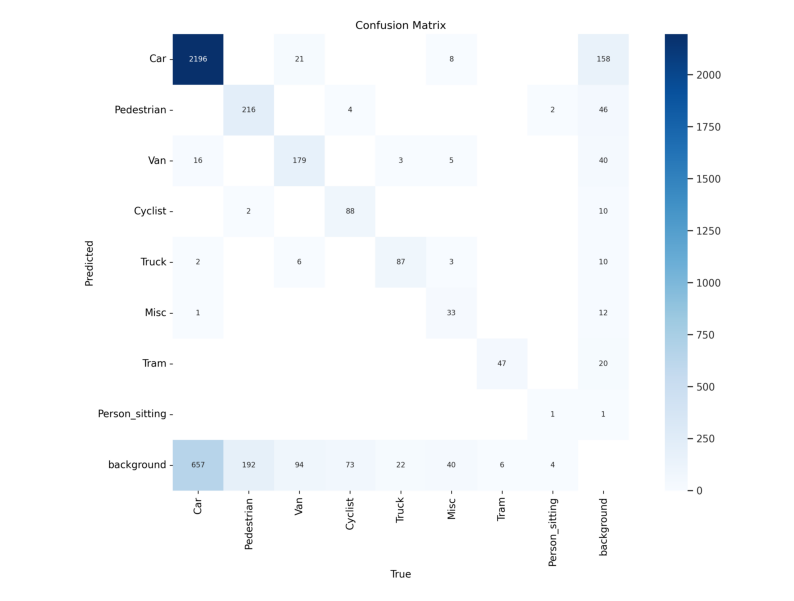

In [16]:
plt.figure(figsize=(10,20))
plt.imshow(Image.open('./yolov8n-kitti/val/confusion_matrix.png'))
plt.axis('off')
plt.show()

# Predictions

In [7]:
model = YOLO('./yolov8n-kitti/train/weights/best.pt')

In [8]:
test = [os.path.join(test_path, f) for f in os.listdir(test_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.webp'))]

In [11]:
model.predict(test[725],save=True)


image 1/1 d:\WafaMefteh\DataBase\data_object_image_2\testing\image_2\000725.png: 224x640 1 Car, 58.3ms
Speed: 2.1ms preprocess, 58.3ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 640)
Results saved to runs\detect\predict6


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Car', 1: 'Pedestrian', 2: 'Van', 3: 'Cyclist', 4: 'Truck', 5: 'Misc', 6: 'Tram', 7: 'Person_sitting', 8: 'DontCare'}
 orig_img: array([[[ 53, 165, 118],
         [ 51, 156, 117],
         [ 51, 140,  73],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[ 63, 141, 115],
         [ 59, 130, 120],
         [ 60, 123,  56],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[ 65, 109,  78],
         [ 62, 122,  72],
         [ 64, 115, 119],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[ 30,  21,  17],
         [ 28,  20,  17],
         [ 27,  20,  17],
         ...,
         [149, 184, 180],
         [147, 173, 173],
         [143, 162, 167]],
 
        [[ 29

In [20]:
print(type(test[300]))

<class 'str'>


In [7]:
from PIL import Image

In [8]:
def get_resulting_image(results):
    for r in results:
        im_array = r.plot()  # plot a BGR numpy array of predictions
        im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
        return im


In [13]:
print(get_resulting_image(model.predict(test[300])))


image 1/1 d:\WafaMefteh\DataBase\data_object_image_2\testing\image_2\000300.png: 224x640 4 Cars, 1 Van, 51.8ms
Speed: 2.0ms preprocess, 51.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 640)


<PIL.Image.Image image mode=RGB size=1242x375 at 0x1F9AEE83E90>



image 1/1 d:\WafaMefteh\DataBase\data_object_image_2\testing\image_2\000300.png: 224x640 4 Cars, 1 Van, 45.4ms
Speed: 1.0ms preprocess, 45.4ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 640)


In [21]:
preds = list(Path('yolov8n-kitti/train4').glob('*'))

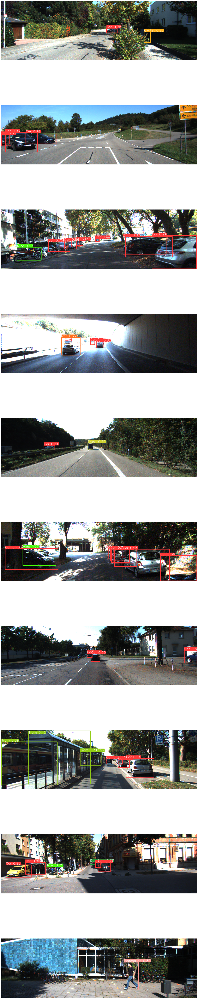

In [22]:
def plot_images(images):
    num_images = len(images)
    rows = num_images
    cols = 1
    fig, axes = plt.subplots(rows, cols, figsize=(15, 80))
    for ax in axes.flat:
        ax.axis('off')
    for i, img_path in enumerate(images):
        img = Image.open(img_path)
        axes[i].imshow(img)
    
    plt.tight_layout()
    plt.show()
    
plot_images(preds)